In [1]:
# https://stackoverflow.com/questions/21971449/how-do-i-increase-the-cell-width-of-the-jupyter-ipython-notebook-in-my-browser
from IPython.display import display, HTML
display(HTML("<style>.container { width:20% !important; }</style>"))

# Preprocessing

In [19]:
from anndata import AnnData
import anndata
from scipy import sparse, io
import scipy
import pandas as pd
import scipy.io
import os
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors
import numpy as np
import seaborn as sns
import math
import scanpy.external as sce
import scrublet as scr
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import chi2_contingency
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests
sns.set(font="Arial", font_scale=0.8, style='ticks')
matplotlib.rcParams['text.color'] = 'black'
sc.settings.verbosity = 3
plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams['figure.dpi'] = 700
%config InLineBackend.figure_format = 'retina'
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#104e8b", "#ffdab9", "#8b0a50"])
batch_palette=['#689aff', '#fdbf6f', '#b15928']

# Input Endothelial Cells (Attach the actual preprocessing above)
test3_endo = sc.read_h5ad("/Users/mhryansohn/Desktop/01.Workspace/01.Projects/01.Vascular_Aging/test3_endo.h5ad")
test3_endo

# Assigning "Age" to anndata.obs
test3_endo.obs['Age'] = test3_endo.obs['batch']
test3_endo.uns['Age_colors'] = ['#689aff', '#fdbf6f', '#b15928']

endo_leiden_to_celltype_dict = {'0': 'EC1',
                                '1': 'EC4',
                                '2': 'EC2',
                                '3': 'EC3',
                                '4': 'EC5',
                                '5': 'EC6'}

test3_endo.obs['Subpopulations of Endothelial Cells'] = test3_endo.obs['endo_leiden_r05'].map(lambda x: endo_leiden_to_celltype_dict[x]).astype('category')
lin = ('EC1', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6')
test3_endo.obs['Subpopulations of Endothelial Cells'] = test3_endo.obs['Subpopulations of Endothelial Cells'].cat.reorder_categories(list(lin), ordered=True)

# Figure [A, B]

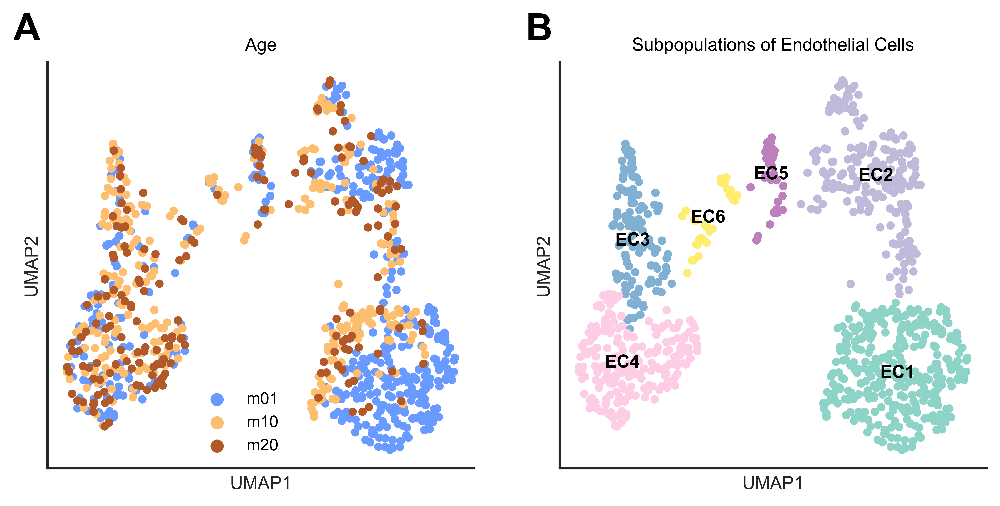

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(9, 4))

sc.pl.umap(test3_endo, color=['Age'], add_outline=False, legend_loc='right margin', show=False, size=80, ax=axes[0])
axes[0].legend(frameon=False, loc='lower center', bbox_to_anchor=(0.45, 0))
sc.pl.umap(test3_endo, color=['Subpopulations of Endothelial Cells'], add_outline=False, legend_loc='on data', color_map=cmap, palette='Set3', show=False, size=80, ax=axes[1])
sns.despine(ax=axes[0])
sns.despine(ax=axes[1])
axes[0].text(-7.5, 8, "A", size=20, weight='bold')
axes[1].text(-7.5, 8, "B", size=20, weight='bold')

plt.savefig("FigureAB.pdf")

# Figure [C]

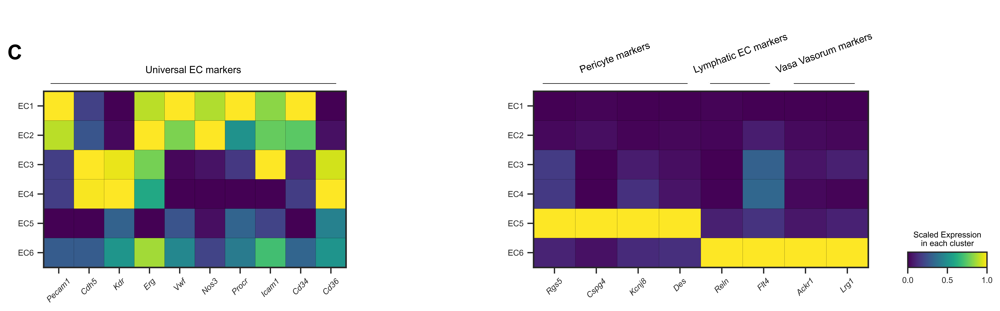

In [21]:
uni_ec = {'Universal EC markers': ["Pecam1", "Cdh5", "Kdr", 'Erg', 'Vwf', "Nos3", 'Procr', 'Icam1', 'Cd34', 'Cd36', ]}
ec_others = {'Pericyte markers': ['Rgs5', 'Cspg4', 'Kcnj8', 'Des'], 'Lymphatic EC markers': ['Reln', 'Flt4'], 'Vasa Vasorum markers': ['Ackr1', 'Lrg1']}

fig, axes = plt.subplots(1, 2, figsize=(13.5, 4.3))
sns.despine()
mp1 = sc.pl.matrixplot(test3_endo, uni_ec, layer='magic', groupby='Subpopulations of Endothelial Cells', dendrogram=False, cmap='viridis', standard_scale='var', colorbar_title='Scaled\nexpression', var_group_rotation=0, return_fig=True, ax=axes[0])
mp1.style(edge_color='black')
mp1.get_axes()['mainplot_ax'].set_xticklabels(labels=list(uni_ec.values())[0], fontstyle='italic', rotation=45)
mp1.get_axes()['color_legend_ax'].remove()
axes[0].axhline(y=0.71, xmin=0.015, xmax=0.645, linewidth=2.0, c="black")

mp2 = sc.pl.matrixplot(test3_endo, ec_others, layer='magic', groupby='Subpopulations of Endothelial Cells', dendrogram=False, cmap='viridis', standard_scale='var', var_group_rotation=0, return_fig=True, ax=axes[1])
mp2.legend(width=0.7, title='Scaled Expression\nin each cluster')
mp2.var_group_rotation = 20
mp2.style(edge_color='black')

mp2.get_axes()['mainplot_ax'].set_xticklabels(labels=list(x for xs in list(ec_others.values()) for x in xs), fontstyle='italic', rotation=45)

axes[1].axhline(y=0.71, xmin=0.019, xmax=0.34, linewidth=2.0, c="black")
axes[1].axhline(y=0.71, xmin=0.388, xmax=0.52, linewidth=2.0, c="black")
axes[1].axhline(y=0.71, xmin=0.575, xmax=0.707, linewidth=2.0, c="black")

axes[0].text(-0.08, 0.8, "C", size=20, weight='bold')

plt.tight_layout()

plt.savefig("FigureC.pdf")

#### Removing EC5 and EC6

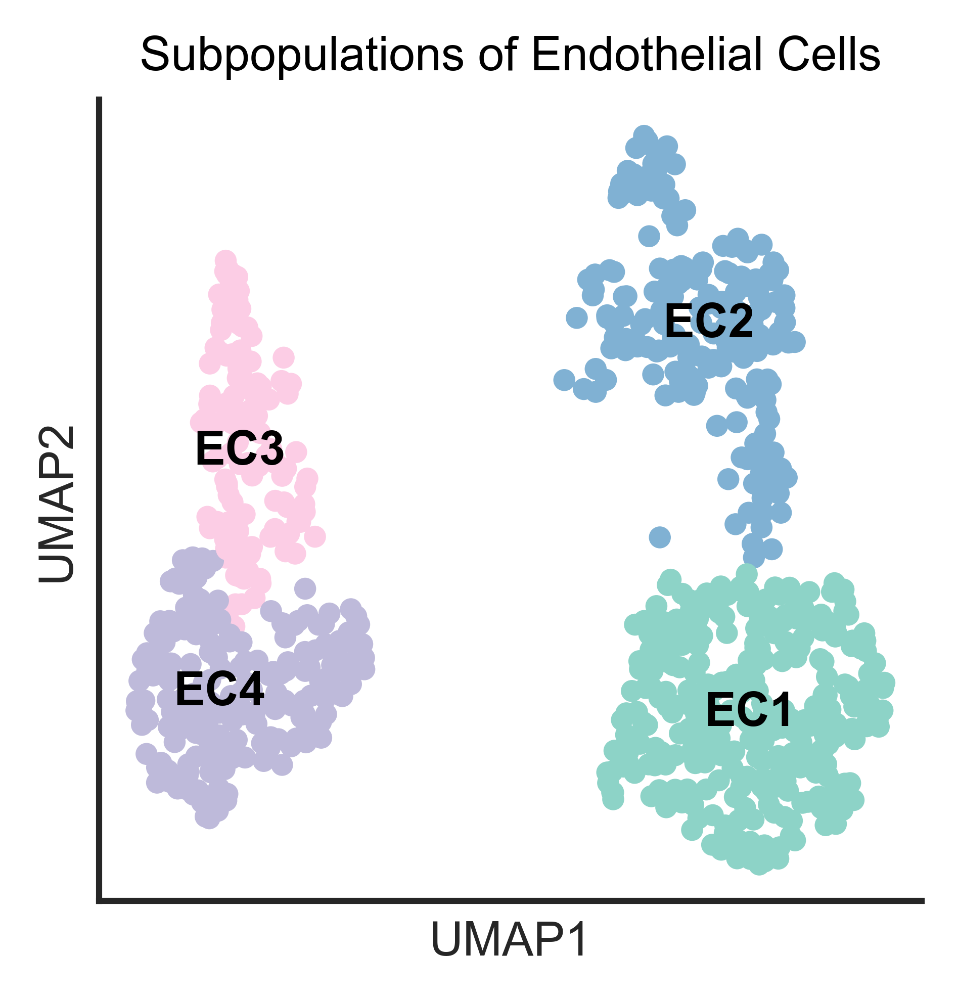

In [22]:
test3_endo2 = test3_endo[~test3_endo.obs['Subpopulations of Endothelial Cells'].isin(['EC5', 'EC6'])].copy()
colormap = {'EC1': '#8dd3c7',
            'EC2': '#80b1d3',
            'EC3': '#fccde5',
            'EC4': '#bebada'}
ax = sc.pl.umap(test3_endo2, color='Subpopulations of Endothelial Cells', palette=colormap, legend_loc='on data', show=False, size=80) # update colormap
sns.despine(ax=ax)

lin = ('EC1', 'EC2', 'EC3', 'EC4')
test3_endo2.obs['Subpopulations of Endothelial Cells'] = test3_endo2.obs['Subpopulations of Endothelial Cells'].cat.reorder_categories(list(lin), ordered=True)

# Figure [D]

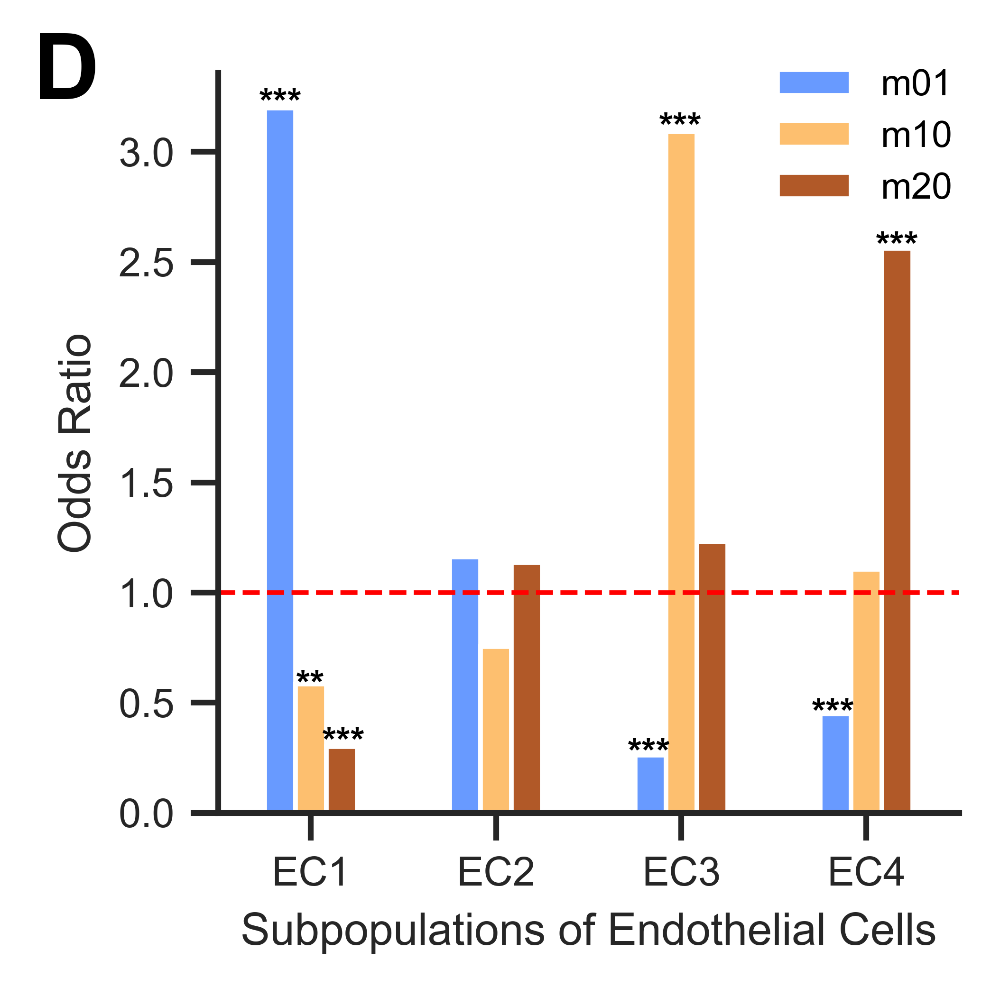

In [23]:
df = test3_endo2.obs[['batch', 'Subpopulations of Endothelial Cells']]
df_pivot = pd.crosstab(df['batch'], df['Subpopulations of Endothelial Cells'], normalize=False, margins=True)

oddsratio_df, pvalue_df = list(), list()
for month in df_pivot.index[:-1]:
    oddsratio, pvalues = list(), list()
    for celltype in df_pivot.columns[:-1]:
#        table = np.array([ [df_pivot[celltype][month], df_pivot[celltype]['All'] - df_pivot[celltype][month] ], [df_pivot['All'][month], df_pivot['All']['All'] - df_pivot['All'][month]] ])
        table = np.array([ [df_pivot[celltype][month], df_pivot['All'][month] - df_pivot[celltype][month]], [df_pivot[celltype]['All'] - df_pivot[celltype][month], (df_pivot['All']['All'] - df_pivot['All'][month]) - (df_pivot[celltype]['All'] - df_pivot[celltype][month])] ])
        oddsr, p = fisher_exact(table, alternative='two-sided')
        oddsratio.append(oddsr)
        pvalues.append(p)
    oddsratio_df.append(oddsratio)
    pvalues = multipletests(pvals=pvalues, alpha=0.01, method='fdr_bh')[1]
    pvalue_df.append(pvalues)

Odds = pd.DataFrame(oddsratio_df, index=df_pivot.index[:-1], columns=df_pivot.columns[:-1])
Pvalues = pd.DataFrame(pvalue_df, index=df_pivot.index[:-1], columns=df_pivot.columns[:-1])

df_final = pd.concat([Odds, Pvalues], axis=0)
df_final

batch_palette= {'m01': '#689aff',
                'm10': '#fdbf6f',
                'm20': '#b15928'}

ax = df_final.iloc[:3].sort_values(axis=1, by='Subpopulations of Endothelial Cells').T.plot.bar(color=batch_palette, rot=0) # Odds ratio
ax.legend(loc='upper left', bbox_to_anchor=(0.71, 1.05), frameon=False, prop={'size':8})
ax.set_ylabel('Odds Ratio')
ax.axhline(y=1.0, color="red", linewidth=1.0, linestyle='--')
plt.tight_layout()
sns.despine(ax=ax)
ax.text(-1.5, 3.24, "D", size=20, weight='bold')
ax.text(-0.28, 3.17, "***", size=8, weight='bold') #EC1 m01
ax.text(-0.08, 0.53, "**", size=8, weight='bold') #EC1 m10
ax.text(0.06, 0.27, "***", size=8, weight='bold') #EC1 m20
ax.text(1.71, 0.22, "***", size=8, weight='bold') #EC3 m01
ax.text(1.88, 3.06, "***", size=8, weight='bold') #EC3 m10
ax.text(2.705, 0.4, "***", size=8, weight='bold') #EC4 m01
ax.text(3.05, 2.52, "***", size=8, weight='bold') #EC4 m20

plt.savefig("FigureD.pdf")

# Figure [E] => in separate notebook

# Figure [F]

<class 'matplotlib.axes._subplots.AxesSubplot'>


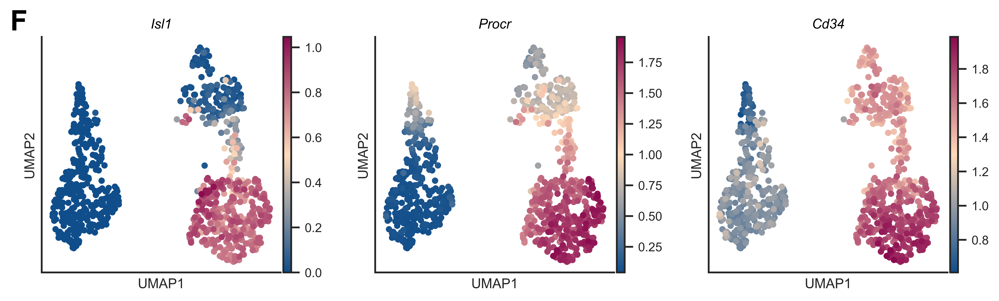

In [24]:
genes = ['Isl1', 'Procr', 'Cd34']

axes = sc.pl.umap(test3_endo2, color=genes, add_outline=False, legend_loc='right margin', color_map=cmap, palette='Set3', show=False, layer='magic', size=80, ncols=4)

print(type(axes[0]))
for i in range(len(genes)):
    axes[i].set_title(genes[i], style='italic')
    sns.despine(ax=axes[i])

axes[0].text(-8.5, 7.7, "F", size=20, weight='bold')

plt.savefig("FigureF.pdf")

# Figure [G]

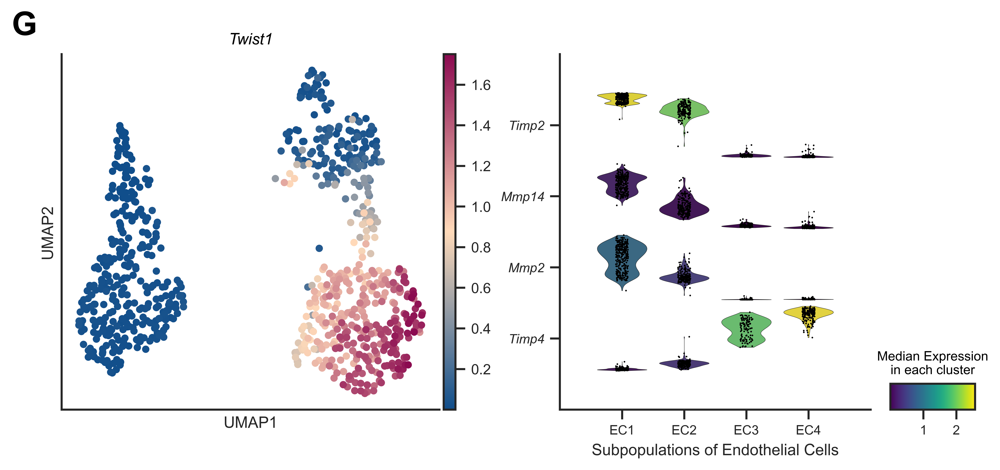

In [49]:
# Twist1 UMAP plot and stacked violin plot
ec1_markers = ['Timp2', 'Mmp14', 'Mmp2', 'Timp4']

fig, axes = plt.subplots(1, 2, figsize=(10, 4), )
sc.pl.umap(test3_endo2, color=['Twist1'], add_outline=False, legend_loc='right margin', color_map=cmap, show=False, layer='magic', size=80, wspace=1, hspace=1, ax=axes[0])
axes[0].set_title('Twist1', style='italic')
sns.despine(ax=axes[0])

plot = sc.pl.StackedViolin(test3_endo2, ec1_markers, groupby='Subpopulations of Endothelial Cells', layer='magic', cmap='viridis', figsize=(7,5), return_fig=True, show=False, ax=axes[1])
plot.legend(title='Median Expression\nin each cluster')
plot.style(cmap='viridis', stripplot=True, jitter=True)
plot.swap_axes(swap_axes=True)
plot.get_axes()['mainplot_ax'].set_xticklabels(labels=['EC1', 'EC2', 'EC3', 'EC4'], rotation=0)
plot.get_axes()['mainplot_ax'].set_yticklabels(labels=ec1_markers, fontstyle='italic')
plot.get_axes()['mainplot_ax'].set_xlabel("Subpopulations of Endothelial Cells")
sns.despine(ax=plot.get_axes()['mainplot_ax'], left=False, bottom=False)

axes[0].text(-8.5, 8, "G", size=20, weight='bold')

plt.savefig("FigureG.pdf")

# Figure [H]

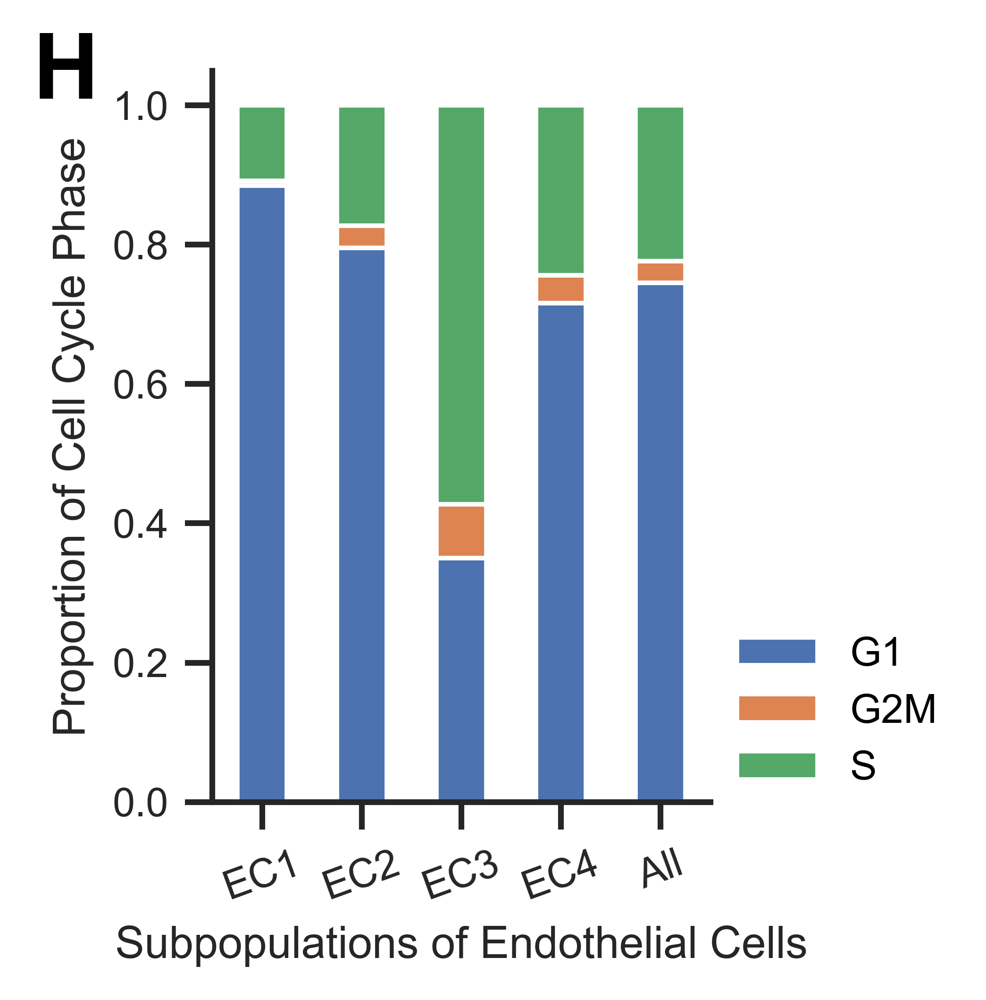

In [45]:
df = test3_endo2.obs[['Subpopulations of Endothelial Cells', 'phase']]
ax = pd.crosstab(df['Subpopulations of Endothelial Cells'], df['phase'], normalize='index', margins=True).plot.bar(stacked=True, rot=20)
ax.legend(loc='lower left', frameon=False, bbox_to_anchor=(0.98, -0.03))
ax.set_ylabel('Proportion of Cell Cycle Phase')
sns.despine(ax=ax)
plt.tight_layout()

ax.text(-2.3, 1.01, "H", size=20, weight='bold')

plt.savefig("FigureH.pdf")

# Figure [I]

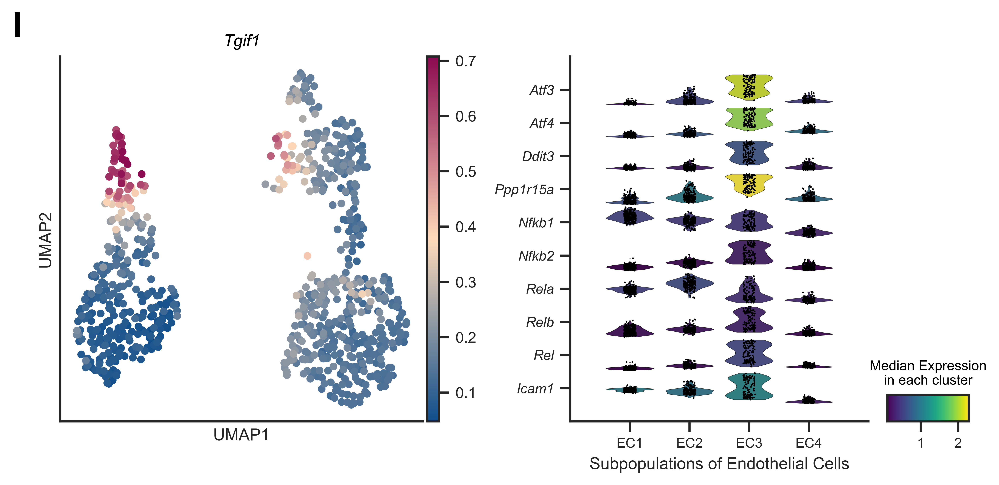

In [61]:
ec3_markers = ['Atf3', 'Atf4', 'Ddit3', 'Ppp1r15a','Nfkb1', 'Nfkb2', 'Rela', 'Relb', 'Rel', 'Icam1']

fig, axes = plt.subplots(1, 2, figsize=(8.0, 4), tight_layout=True)

sc.pl.umap(test3_endo2, color=['Tgif1'], add_outline=False, legend_loc='right margin', color_map=cmap, show=False, layer='magic', size=80, wspace=1, hspace=1, ax=axes[0])
axes[0].set_title('Tgif1', style='italic')
sns.despine(ax=axes[0])

plot = sc.pl.StackedViolin(test3_endo2, ec3_markers, groupby='Subpopulations of Endothelial Cells', layer='magic', cmap='viridis', figsize=(7,5), return_fig=True, show=False, ax=axes[1])
plot.legend(title='Median Expression\nin each cluster')
plot.style(cmap='viridis', stripplot=True, jitter=True)
plot.swap_axes(swap_axes=True)
plot.get_axes()['mainplot_ax'].set_xticklabels(labels=['EC1', 'EC2', 'EC3', 'EC4'], rotation=0)
plot.get_axes()['mainplot_ax'].set_yticklabels(labels=ec3_markers, fontstyle='italic')
plot.get_axes()['mainplot_ax'].set_xlabel("Subpopulations of Endothelial Cells")
sns.despine(ax=plot.get_axes()['mainplot_ax'], left=False, bottom=False)

axes[0].text(-8.5, 8, "I", size=20, weight='bold')

plt.savefig("FigureI_new.pdf")

# Figure [J]

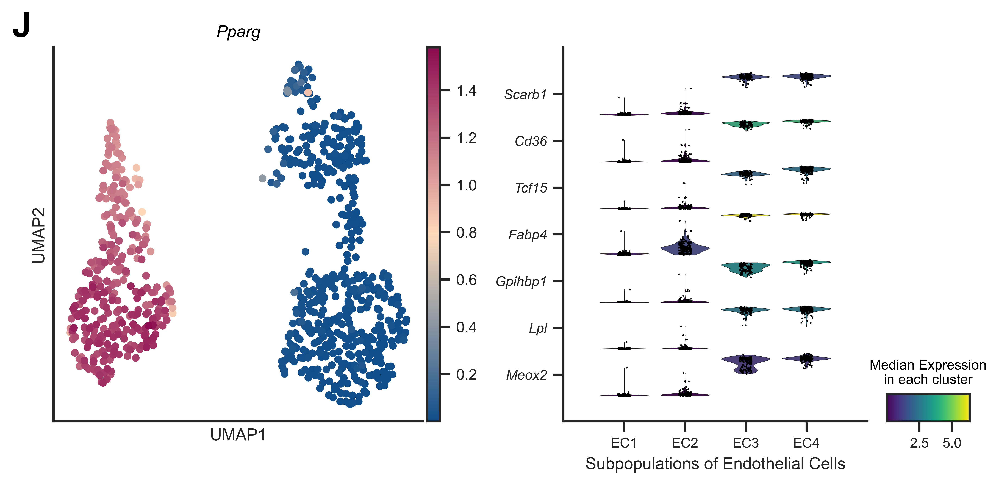

In [50]:
# Twist1 UMAP plot and stacked violin plot
ec4_markers = ['Scarb1', 'Cd36', 'Tcf15', 'Fabp4', 'Gpihbp1', 'Lpl', 'Meox2']
fig, axes = plt.subplots(1, 2, figsize=(8, 4), tight_layout=True)
sc.pl.umap(test3_endo2, color=['Pparg'], add_outline=False, legend_loc='right margin', color_map=cmap, show=False, layer='magic', size=80, ax=axes[0])
axes[0].set_title('Pparg', style='italic')
sns.despine(ax=axes[0])

plot = sc.pl.StackedViolin(test3_endo2, ec4_markers, groupby='Subpopulations of Endothelial Cells', layer='magic', cmap='viridis', figsize=(7,5), return_fig=True, show=False, ax=axes[1]).swap_axes(swap_axes=True)
plot.legend(title='Median Expression\nin each cluster')
plot.style(cmap='viridis', stripplot=True, jitter=True)

plot.get_axes()['mainplot_ax'].set_xticklabels(labels=['EC1', 'EC2', 'EC3', 'EC4'], rotation=0)
plot.get_axes()['mainplot_ax'].set_yticklabels(labels=ec4_markers, fontstyle='italic')
plot.get_axes()['mainplot_ax'].set_xlabel("Subpopulations of Endothelial Cells")
sns.despine(ax=plot.get_axes()['mainplot_ax'])
axes[0].text(-8.1, 7.7, "J", size=20, weight='bold')

plt.savefig("FigureJ_new.pdf")

# Figure [K]

<class 'matplotlib.axes._subplots.AxesSubplot'>


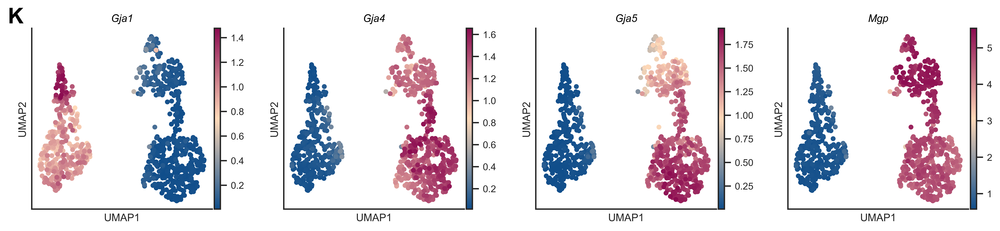

In [53]:
genes = ['Gja1', 'Gja4', 'Gja5', 'Mgp']

axes = sc.pl.umap(test3_endo2, color=genes, add_outline=False, legend_loc='right margin', color_map=cmap, palette='Set3', show=False, layer='magic', size=80, ncols=4)

print(type(axes[0]))
for i in range(len(genes)):
    axes[i].set_title(genes[i], style='italic')
    sns.despine(ax=axes[i])

axes[0].text(-8.5, 7.7, "K", size=20, weight='bold')

plt.savefig("FigureK_new.pdf")

# Figure [L]

<class 'matplotlib.axes._subplots.AxesSubplot'>


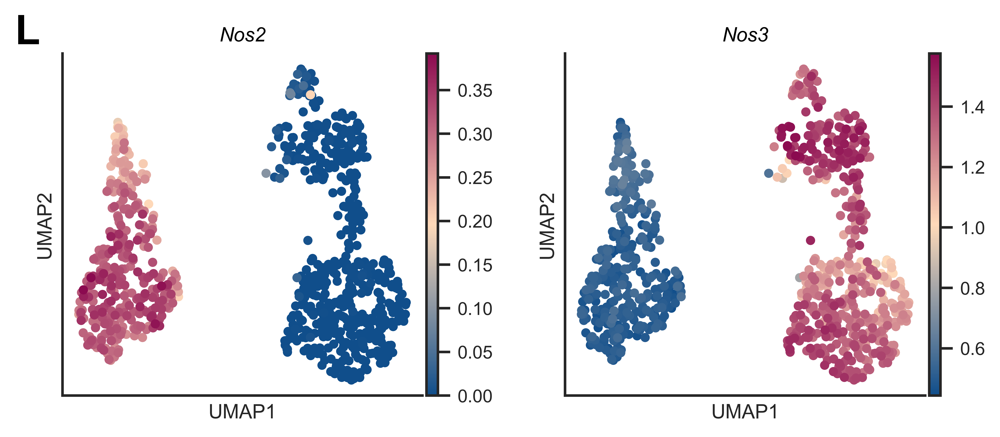

In [60]:
genes = ['Nos2', 'Nos3']

axes = sc.pl.umap(test3_endo2, color=genes, add_outline=False, legend_loc='right margin', color_map=cmap, palette='Set3', show=False, layer='magic', size=80, ncols=2)

print(type(axes[0]))
for i in range(len(genes)):
    axes[i].set_title(genes[i], style='italic')
    sns.despine(ax=axes[i])

axes[0].text(-8.5, 7.7, "L", size=20, weight='bold')

plt.savefig("FigureL_new.pdf")

In [17]:
print(matplotlib.rcParams['xtick.color'])

.15
